# Consumed emissions 

* Combine 930 import/export/demand data with actual generation data. 
    * TODO: because generation data 
* Use gridemissions code to calculate consumed 
* Compare 930 data to our estimated BA-level generation data 


In [133]:
import plotly.express as px
import os
import pandas as pd
import numpy as np
import missingno as msno

In [411]:
%reload_ext autoreload
%autoreload 2

# Tell python where to look for modules. 
# Depending on how your jupyter handles working directories, this may not be needed.
import sys
sys.path.append('../../hourly-egrid/')

from src.consumed import HourlyBaDataEmissionsCalc

In [7]:
from gridemissions.emissions import BaDataEmissionsCalc
from gridemissions.load import BaData

In [8]:
cleaned = BaData("../data/eia930/chalendar/EBA_adjusted_elec.csv")

In [10]:
consumed_calc = BaDataEmissionsCalc(cleaned)

In [12]:
consumed_calc.process()

2022-06-03 12:37:16,580 - clean - INFO - Running BaDataEmissionsCalc for 33160 rows
2022-06-03 12:37:46,999 - clean - INFO - Calculating consumption emissions...
2022-06-03 12:40:19,647 - clean - INFO - Elapsed time was 152.648 seconds


/Users/gailin.pease/singularity/gridemissions/src/gridemissions/emissions.py:131: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.df.loc[:, self.KEY_poll["ID"] % (ba, ba2)] = (
/Users/gailin.pease/singularity/gridemissions/src/gridemissions/emissions.py:131: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.df.loc[:, self.KEY_poll["ID"] % (ba, ba2)] = (
/Users/gailin.pease/singularity/gridemissions/src/gridemissions/emissions.py:131: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `

2022-06-03 12:40:35,855 - clean - WARNING - Consumption calcs - unimplemented balance check!


In [13]:
consumed_calc.poll_data.df.head()

,CO2_AEC_NG,CO2_AECI_NG,CO2_AESO_NG,CO2_AVA_NG,CO2_AVRN_NG,CO2_AZPS_NG,CO2_BANC_NG,CO2_BCHA_NG,CO2_BPAT_NG,CO2_CEN_NG,...,CO2_TEC_TI,CO2_TEPC_TI,CO2_TIDC_TI,CO2_TPWR_TI,CO2_TVA_TI,CO2_WACM_TI,CO2_WALC_TI,CO2_WAUW_TI,CO2_WWA_TI,CO2_YAD_TI
2018-07-01 00:00:00+00:00,722837.946646,2.558987e+06,439.000001,114772.657761,80514.740568,1.976384e+06,499054.478622,4.0,335612.776671,439.000005,...,145496.799517,-195423.195261,-32103.830319,-5155.741268,-308262.593447,1.084487e+06,131588.621217,-33848.188237,768.834230,737.802770
2018-07-01 01:00:00+00:00,666238.223802,2.485406e+06,439.000001,117471.956723,86781.607203,2.097934e+06,493907.667789,4.0,337522.192463,439.000007,...,76228.959440,-433556.444520,-36644.714831,-5085.824444,-351187.559304,1.039144e+06,100696.882219,-31867.283650,639.526286,736.400549
2018-07-01 02:00:00+00:00,611888.202489,2.323381e+06,439.000000,121503.630319,50087.060795,2.086198e+06,510814.609778,4.0,340554.091374,439.000002,...,136407.793949,-639799.890576,-39488.823873,-4742.032433,-272446.874341,1.061485e+06,139840.243117,-27365.557338,881.772096,-494.425287
2018-07-01 03:00:00+00:00,533910.006339,2.111128e+06,439.000000,124344.171590,45634.827326,2.073630e+06,513511.615818,4.0,344680.136369,439.000002,...,208915.040962,-706243.568145,-32004.958832,-4816.348165,-21187.715412,1.095513e+06,231178.509174,-28912.100148,938.833025,-516.543180
2018-07-01 04:00:00+00:00,475535.196116,2.111126e+06,439.000001,54484.881076,47041.598601,1.959990e+06,542214.458616,4.0,347795.892060,439.000015,...,216172.862148,-199062.018616,-23278.303706,-5015.839512,-77536.804447,1.062628e+06,246455.090351,-29542.258671,551.944310,-453.347052


In [15]:
consumed_calc.ba_data.df.head()

,EBA.AEC-ALL.NG.H,EBA.AECI-ALL.NG.H,EBA.AESO-ALL.NG.H,EBA.AVA-ALL.NG.H,EBA.AVRN-ALL.NG.H,EBA.AZPS-ALL.NG.H,EBA.BANC-ALL.NG.H,EBA.BCHA-ALL.NG.H,EBA.BPAT-ALL.NG.H,EBA.CEN-ALL.NG.H,...,EBA.SOCO-ALL.NG.WND.H,EBA.SRP-ALL.NG.WND.H,EBA.SWPP-ALL.NG.WND.H,EBA.TEPC-ALL.NG.WND.H,EBA.TVA-ALL.NG.WND.H,EBA.WACM-ALL.NG.WND.H,EBA.WALC-ALL.NG.WND.H,EBA.WWA-ALL.NG.WND.H,EBA.CISO-ALL.NG.GEO.H,EBA.CISO-ALL.NG.BIO.H
2018-07-01 00:00:00+00:00,1092.779659,3321.667830,1.0,901.061457,515.973178,6237.237604,2743.420871,1.0,15626.566334,1.0,...,1.0,1.0,23.283722,1.000000,1.0,134.544130,113.401225,66.769608,885.649611,590.433074
2018-07-01 01:00:00+00:00,991.196056,3169.366634,1.0,917.734269,482.226187,6437.390541,2747.264828,1.0,15539.165895,1.0,...,1.0,1.0,22.835608,1.000000,1.0,263.753429,119.288097,54.724246,873.514070,582.342713
2018-07-01 02:00:00+00:00,908.998219,2971.808204,1.0,936.498297,344.546363,6321.129798,2705.808410,1.0,15329.849623,1.0,...,1.0,1.0,32.191482,5.775466,1.0,350.360920,134.120704,76.355571,880.755596,587.170397
2018-07-01 03:00:00+00:00,839.243206,2639.350969,1.0,953.925471,352.895963,6271.383003,2589.152937,1.0,14927.093560,1.0,...,1.0,1.0,37.416053,1.000000,1.0,409.976174,169.703895,84.220707,895.002821,596.668548
2018-07-01 04:00:00+00:00,734.096674,2514.438278,1.0,899.547923,366.437215,6003.216878,2442.159881,1.0,14626.434347,1.0,...,1.0,1.0,34.731227,23.238498,1.0,400.154611,204.595649,46.995358,889.121070,592.747380


In [19]:
consumed_calc.df 

,EBA.AEC-ALL.NG.H,EBA.AECI-ALL.NG.H,EBA.AESO-ALL.NG.H,EBA.AVA-ALL.NG.H,EBA.AVRN-ALL.NG.H,EBA.AZPS-ALL.NG.H,EBA.BANC-ALL.NG.H,EBA.BCHA-ALL.NG.H,EBA.BPAT-ALL.NG.H,EBA.CEN-ALL.NG.H,...,CO2_TEC_TI,CO2_TEPC_TI,CO2_TIDC_TI,CO2_TPWR_TI,CO2_TVA_TI,CO2_WACM_TI,CO2_WALC_TI,CO2_WAUW_TI,CO2_WWA_TI,CO2_YAD_TI
2018-07-01 00:00:00+00:00,1092.779659,3321.667830,1.0,901.061457,515.973178,6237.237604,2743.420871,1.000000,15626.566334,1.0,...,145496.799517,-195423.195261,-32103.830319,-5155.741268,-308262.593447,1.084487e+06,131588.621217,-33848.188237,768.834230,737.802770
2018-07-01 01:00:00+00:00,991.196056,3169.366634,1.0,917.734269,482.226187,6437.390541,2747.264828,1.000000,15539.165895,1.0,...,76228.959440,-433556.444520,-36644.714831,-5085.824444,-351187.559304,1.039144e+06,100696.882219,-31867.283650,639.526286,736.400549
2018-07-01 02:00:00+00:00,908.998219,2971.808204,1.0,936.498297,344.546363,6321.129798,2705.808410,1.000000,15329.849623,1.0,...,136407.793949,-639799.890576,-39488.823873,-4742.032433,-272446.874341,1.061485e+06,139840.243117,-27365.557338,881.772096,-494.425287
2018-07-01 03:00:00+00:00,839.243206,2639.350969,1.0,953.925471,352.895963,6271.383003,2589.152937,1.000000,14927.093560,1.0,...,208915.040962,-706243.568145,-32004.958832,-4816.348165,-21187.715412,1.095513e+06,231178.509174,-28912.100148,938.833025,-516.543180
2018-07-01 04:00:00+00:00,734.096674,2514.438278,1.0,899.547923,366.437215,6003.216878,2442.159881,1.000000,14626.434347,1.0,...,216172.862148,-199062.018616,-23278.303706,-5015.839512,-77536.804447,1.062628e+06,246455.090351,-29542.258671,551.944310,-453.347052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-19 16:00:00+00:00,498.103611,2836.089832,1.0,1090.061558,275.202113,1417.766657,1098.319160,1.000000,9536.083233,1.0,...,-2121.702906,-92633.515111,-5499.356746,-25200.816098,-683528.878877,8.652639e+05,363036.949770,-24268.781551,441.618706,332.267508
2022-04-19 17:00:00+00:00,494.389847,2719.171075,1.0,1104.331197,353.213201,1490.980024,1054.930411,38.670215,8602.810414,1.0,...,-8227.715267,-127937.205537,8620.051539,-24755.916280,-695219.246834,8.014298e+05,340981.405924,-22779.928431,593.059463,311.857525
2022-04-19 18:00:00+00:00,495.165932,2744.567002,1.0,1038.196206,286.370591,1994.858579,1093.777807,94.416558,8433.456960,1.0,...,-64610.676870,-180419.974431,9639.991041,-23640.843283,-751356.285835,8.234680e+05,285763.915345,-23462.290458,793.438462,328.210069
2022-04-19 19:00:00+00:00,496.261427,2622.821002,1.0,1044.029664,279.406854,2026.436018,998.115225,88.614224,8270.838690,1.0,...,-64010.350830,-181241.848237,4754.046332,-24873.629063,-696737.700717,8.388669e+05,281108.727346,-23456.960204,742.414693,344.181685


In [30]:
[c for c in consumed_calc.df.columns if ("CISO" in c) and ("NG" in c)]

['EBA.CISO-ALL.NG.H',
 'EBA.CISO-ALL.NG.COL.H',
 'EBA.CISO-ALL.NG.NG.H',
 'EBA.CISO-ALL.NG.NUC.H',
 'EBA.CISO-ALL.NG.OIL.H',
 'EBA.CISO-ALL.NG.OTH.H',
 'EBA.CISO-ALL.NG.SUN.H',
 'EBA.CISO-ALL.NG.WAT.H',
 'EBA.CISO-ALL.NG.WND.H',
 'EBA.CISO-ALL.NG.GEO.H',
 'EBA.CISO-ALL.NG.BIO.H',
 'CO2_CISO_NG']

In [29]:
px.line(consumed_calc.df, x=consumed_calc.df.index, y=['CO2_CISO_D', "CO2_CISO_NG"])

In [31]:
consumed_calc.EF

{'WAT': 4,
 'NUC': 16,
 'SUN': 46,
 'NG': 469,
 'WND': 12,
 'COL': 1000,
 'OIL': 840,
 'OTH': 439,
 'UNK': 439,
 'BIO': 230,
 'GEO': 42}

# Use our generation #s 

Replace each total generation column (EBA.{ba}-ALL.NG.H) with our generation for that BA and hour 

TODO: figure out if we need to edit demand to align with our generation 

note: SRC flags are used only in `_add_production_emissions`, so don't need after we rewrite to use hourly rates

In [420]:
hourly_consumed_calc = HourlyBaDataEmissionsCalc("../data/eia930/chalendar/EBA_adjusted_elec.csv")

In [421]:
hourly_consumed_calc.process()

2022-06-06 11:02:42,515 - clean - INFO - Running BaDataEmissionsCalc for 8784 rows
2022-06-06 11:02:42,562 - clean - WARNING - Setting 18 NaNs to zero
2022-06-06 11:02:42,725 - clean - INFO - Calculating consumption emissions...
2022-06-06 11:04:02,125 - clean - INFO - Elapsed time was 79.3991 seconds


/Users/gailin.pease/singularity/gridemissions/src/gridemissions/emissions.py:131: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/gailin.pease/singularity/gridemissions/src/gridemissions/emissions.py:131: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/gailin.pease/singularity/gridemissions/src/gridemissions/emissions.py:131: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.co

2022-06-06 11:04:11,143 - clean - WARNING - Consumption calcs - unimplemented balance check!


In [429]:
ba = "PACE"
px.line(consumed_calc.df, x=consumed_calc.df.index, y=[f'CO2_{ba}_D', f"CO2_{ba}_NG"])

In [431]:
ba = "SRP"
px.line(hourly_consumed_calc.df, x=hourly_consumed_calc.df.index, y=[f'CO2_{ba}_D', f"CO2_{ba}_NG"])

In [423]:
interest_cols = hourly_consumed_calc.poll_data.df[[c for c in hourly_consumed_calc.poll_data.df.columns if c.split("_")[-1]=="NG"]]
interest_cols = interest_cols.reindex(sorted(interest_cols.columns), axis=1)
interest_cols.describe()

,CO2_AECI_NG,CO2_AEC_NG,CO2_AESO_NG,CO2_AVA_NG,CO2_AVRN_NG,CO2_AZPS_NG,CO2_BANC_NG,CO2_BCHA_NG,CO2_BPAT_NG,CO2_CEN_NG,CO2_CFE_NG,CO2_CHPD_NG,CO2_CISO_NG,CO2_CPLE_NG,CO2_CPLW_NG,CO2_DEAA_NG,CO2_DOPD_NG,CO2_DUK_NG,CO2_EEI_NG,CO2_EPE_NG,CO2_ERCO_NG,CO2_FMPP_NG,CO2_FPC_NG,CO2_FPL_NG,CO2_GCPD_NG,CO2_GRID_NG,CO2_GRIF_NG,CO2_GRMA_NG,CO2_GVL_NG,CO2_GWA_NG,CO2_HGMA_NG,CO2_HQT_NG,CO2_HST_NG,CO2_IESO_NG,CO2_IID_NG,CO2_IPCO_NG,CO2_ISNE_NG,CO2_JEA_NG,CO2_LDWP_NG,CO2_LGEE_NG,CO2_MHEB_NG,CO2_MISO_NG,CO2_NBSO_NG,CO2_NEVP_NG,CO2_NSB_NG,CO2_NWMT_NG,CO2_NYIS_NG,CO2_OVEC_NG,CO2_PACE_NG,CO2_PACW_NG,CO2_PGE_NG,CO2_PJM_NG,CO2_PNM_NG,CO2_PSCO_NG,CO2_PSEI_NG,CO2_SCEG_NG,CO2_SCL_NG,CO2_SC_NG,CO2_SEC_NG,CO2_SEPA_NG,CO2_SOCO_NG,CO2_SPA_NG,CO2_SRP_NG,CO2_SWPP_NG,CO2_TAL_NG,CO2_TEC_NG,CO2_TEPC_NG,CO2_TIDC_NG,CO2_TPWR_NG,CO2_TVA_NG,CO2_WACM_NG,CO2_WALC_NG,CO2_WAUW_NG,CO2_WWA_NG,CO2_YAD_NG
count,8.779000e+03,8.779000e+03,8.779000e+03,8779.000000,8.776000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8779.000000,8.776000e+03,8.779000e+03,8.779000e+03,8779.000000,8766.000000,8776.000000,8.779000e+03,8.778000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8776.000000,8.779000e+03,8777.000000,8.779000e+03,8779.000000,8777.000000,8779.000000,8779.000000,8779.000000,8779.000000,8779.000000,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8779.000000,8.779000e+03,8.779000e+03,8.779000e+03,8779.000000,8.777000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.779000e+03,8.777000e+03,8.779000e+03,8779.000000,8.779000e+03,8.779000e+03,8776.000000,8779.000000,8.779000e+03,8.779000e+03,8.779000e+03,8779.000000,8777.000000,8779.000000
mean,4.154785e+06,6.214760e+05,1.114001e+06,191411.325112,3.501201e+05,3.558089e+06,6.507085e+05,9.623055e+04,2.531537e+06,7.346445e+05,553349.283579,8.238232e+05,1.171680e+07,4.174148e+06,3819.490318,218310.680934,410996.073278,7.445461e+06,1.019209e+06,7.317781e+05,4.300656e+07,2.138824e+06,4.900445e+06,8.876145e+06,486761.008441,4.248670e+05,234536.178983,4.990482e+05,395898.104554,58371.523389,786.101117,1593.019257,-2333.115155,90200.555624,109876.618980,3.345616e+05,5.829811e+06,1.782996e+06,2.612091e+06,7.393422e+06,13885.822019,9.161037e+07,7.275512e+05,3.309846e+06,1713.062167,2.871272e+06,8.256839e+06,2.354932e+06,1.095227e+07,2.418472e+05,1.220616e+06,7.470270e+07,1.924827e+06,3.593732e+06,6.251319e+05,2.347176e+06,5.639139e+05,3.394405e+06,2.021187e+06,2.351213e+05,2.543302e+07,4.661026e+05,4.885605e+06,3.078019e+07,269127.874048,2.439903e+06,2.849043e+06,174492.354722,251650.510367,1.119592e+07,8.574177e+06,8.699450e+05,364159.985511,66250.930903,112340.121585
std,1.115219e+06,3.510197e+05,1.099023e-07,102847.115322,1.736677e+05,1.293890e+06,1.915285e+05,2.313886e-09,1.590719e+06,5.708931e+05,115935.981389,2.267491e+05,4.904743e+06,2.329529e+06,3073.702306,175684.158303,118769.968390,2.906145e+06,5.148226e+05,2.225354e+05,1.293808e+07,5.967230e+05,1.814744e+06,2.826082e+06,128517.893563,2.060921e+05,170129.678550,1.558562e+05,105201.727431,54818.377669,486.990128,716.108735,408.993866,13288.461581,88140.038543,2.715582e+05,2.268288e+06,4.830331e+05,1.058284e+06,1.410149e+06,6454.448579,2.256147e+07,1.525834e+05,1.057087e+06,570.406626,1.291137e+06,3.249577e+06,9.759479e+05,2.455570e+06,1.294295e+05,7.476970e+05,2.122405e+07,5.546010e+05,1.114347e+06,3.795011e+05,7.767516e+05,2.354195e+05,1.342429e+06,5.622521e+05,2.645396e+05,7.834440e+06,1.099076e+05,1.678759e+06,1.116876e+07,57358.837718,6.186245e+05,6.586793e+05,81897.362952,116052.645978,4.533354e+06,1.498919e+06,3.373095e+05,131804.907665,52427.925730,49470.502987
min,1.274813e+06,8.686906e+04,1.114001e+06,31.115520,4.945740e+00,4.435099e+05,1.753441e+05,9.623055e+04,8.918298e+01,1.311080e+03,277377.670243,1.421269e+05,3.546476e+06,7.653261e+05,412.440197,92.936180

In [437]:
hourly_consumed_calc.rates.describe().reindex(sorted(hourly_consumed_calc.rates.columns), axis=1)

,AECI_CO2_RATE,AEC_CO2_RATE,AESO_CO2_RATE,AVA_CO2_RATE,AVRN_CO2_RATE,AZPS_CO2_RATE,BANC_CO2_RATE,BCHA_CO2_RATE,BPAT_CO2_RATE,CEN_CO2_RATE,CFE_CO2_RATE,CHPD_CO2_RATE,CISO_CO2_RATE,CPLE_CO2_RATE,CPLW_CO2_RATE,DEAA_CO2_RATE,DOPD_CO2_RATE,DUK_CO2_RATE,EEI_CO2_RATE,EPE_CO2_RATE,ERCO_CO2_RATE,FMPP_CO2_RATE,FPC_CO2_RATE,FPL_CO2_RATE,GCPD_CO2_RATE,GRID_CO2_RATE,GRIF_CO2_RATE,GRMA_CO2_RATE,GVL_CO2_RATE,GWA_CO2_RATE,HGMA_CO2_RATE,HQT_CO2_RATE,HST_CO2_RATE,IESO_CO2_RATE,IID_CO2_RATE,IPCO_CO2_RATE,ISNE_CO2_RATE,JEA_CO2_RATE,LDWP_CO2_RATE,LGEE_CO2_RATE,MHEB_CO2_RATE,MISO_CO2_RATE,NBSO_CO2_RATE,NEVP_CO2_RATE,NSB_CO2_RATE,NWMT_CO2_RATE,NYIS_CO2_RATE,OVEC_CO2_RATE,PACE_CO2_RATE,PACW_CO2_RATE,PGE_CO2_RATE,PJM_CO2_RATE,PNM_CO2_RATE,PSCO_CO2_RATE,PSEI_CO2_RATE,SCEG_CO2_RATE,SCL_CO2_RATE,SC_CO2_RATE,SEC_CO2_RATE,SEPA_CO2_RATE,SOCO_CO2_RATE,SPA_CO2_RATE,SRP_CO2_RATE,SWPP_CO2_RATE,TAL_CO2_RATE,TEC_CO2_RATE,TEPC_CO2_RATE,TIDC_CO2_RATE,TPWR_CO2_RATE,TVA_CO2_RATE,WACM_CO2_RATE,WALC_CO2_RATE,WAUW_CO2_RATE,WWA_CO2_RATE,YAD_CO2_RATE
count,8784.000000,8784.000000,8.784000e+03,8784.000000,8781.000000,8784.000000,8784.000000,8.784000e+03,8784.000000,8784.000000,8784.000000,8.781000e+03,8784.000000,8784.000000,8.784000e+03,8771.000000,8.781000e+03,8784.000000,8783.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8.781000e+03,8784.000000,8782.000000,8784.000000,8784.000000,8.782000e+03,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8782.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8.784000e+03,8784.000000,8784.000000,8.784000e+03,8784.000000,8784.000000,8782.000000,8784.000000,8784.000000,8784.000000,8784.000000,8781.000000,8.784000e+03,8784.000000,8784.000000,8784.000000,8.784000e+03,8.782000e+03,8.784000e+03
mean,1636.913955,1712.591565,8.248804e+02,297.831909,676.942827,1834.677395,1136.519027,8.248804e+02,216.568733,773.712474,582.860559,8.248804e+02,701.640799,724.001764,8.248804e+02,1172.285190,8.248804e+02,601.654322,2160.194070,1481.984538,1020.356803,1946.260058,1312.540050,662.232476,8.248804e+02,582.860559,1127.875974,1054.741449,2373.483842,8.248804e+02,785.831351,724.001764,-2390.475353,1136.519027,773.712474,254.084241,648.427516,1387.823006,1332.105053,2019.692997,831.448280,1395.611110,1332.105053,1185.028231,1712.591565,1685.815248,582.860559,2344.165003,1811.599877,345.490078,831.448280,920.307095,1339.026937,1025.310245,803.847847,923.354693,8.248804e+02,2261.632986,1832.952304,8.248804e+02,1144.301610,651.119546,706.239632,1119.724206,1476.254449,1054.741449,1951.519743,1133.375441,8.248804e+02,648.835805,2113.324389,785.831351,8.248804e+02,8.248804e+02,8.248804e+02
std,132.115167,570.205926,6.173547e-11,178.086967,381.805613,371.757410,167.401205,6.173547e-11,140.224852,601.211367,122.087707,6.173547e-11,231.317161,325.438806,6.173547e-11,869.695656,6.173547e-11,130.728410,196.770855,176.079490,172.043980,139.316276,122.340386,117.598006,6.173547e-11,122.087707,278.452835,158.498244,255.122442,6.173547e-11,486.984493,325.438806,41.070718,167.401205,601.211367,199.908390,123.812292,151.891641,279.301640,115.659691,386.387368,159.925813,279.301640,202.211298,570.205926,502.457465,122.087707,174.015635,221.278974,230.242257,386.387368,104.462696,349.877692,308.701608,398.097252,228.047750,6.173547e-11,226.109676,132.423974,6.173547e-11,126.738375,267.640405,151.085560,305.047818,177.197880,158.498244,209.078007,289.427892,6.173547e-11,171.456385,138.871588,486.984493,6.173547e-11,6.173547e-11,6.173547e-11
min,824.880393,824.880393,8.248804e+02,0.029200,0.004650,560.314950,149.952100,8.248804e+02,0.006600,1.381000,292.170250,8.248804e+02,190.259900,153.342500,8.248804e+02,124.819450,8.248804e+02,290.745700,1536.855000,824.880393,562.311000,1273.517700,968.892200,344.847350,8.248804e+02,292.170250,8.755100,638.7857

In [435]:
pd.set_option('display.max_columns', 1000) 
interest_cols = hourly_consumed_calc.poll_data.df[[c for c in hourly_consumed_calc.poll_data.df.columns if c.split("_")[-1]=="ID"]]
interest_cols = interest_cols.reindex(sorted(interest_cols.columns), axis=1)
interest_cols.describe()

,CO2_AEC-MISO_ID,CO2_AEC-SOCO_ID,CO2_AECI-MISO_ID,CO2_AECI-SPA_ID,CO2_AECI-SWPP_ID,CO2_AECI-TVA_ID,CO2_AESO-NWMT_ID,CO2_AVA-BPAT_ID,CO2_AVA-CHPD_ID,CO2_AVA-GCPD_ID,CO2_AVA-IPCO_ID,CO2_AVA-NWMT_ID,CO2_AVA-PACW_ID,CO2_AVRN-BPAT_ID,CO2_AVRN-PACW_ID,CO2_AZPS-CISO_ID,CO2_AZPS-GRMA_ID,CO2_AZPS-IID_ID,CO2_AZPS-LDWP_ID,CO2_AZPS-PACE_ID,CO2_AZPS-PNM_ID,CO2_AZPS-SRP_ID,CO2_AZPS-TEPC_ID,CO2_AZPS-WACM_ID,CO2_AZPS-WALC_ID,CO2_BANC-BPAT_ID,CO2_BANC-CISO_ID,CO2_BANC-TIDC_ID,CO2_BCHA-BPAT_ID,CO2_BPAT-AVA_ID,CO2_BPAT-AVRN_ID,CO2_BPAT-BANC_ID,CO2_BPAT-BCHA_ID,CO2_BPAT-CHPD_ID,CO2_BPAT-CISO_ID,CO2_BPAT-DOPD_ID,CO2_BPAT-GCPD_ID,CO2_BPAT-GRID_ID,CO2_BPAT-IPCO_ID,CO2_BPAT-LDWP_ID,CO2_BPAT-NEVP_ID,CO2_BPAT-NWMT_ID,CO2_BPAT-PACW_ID,CO2_BPAT-PGE_ID,CO2_BPAT-PSEI_ID,CO2_BPAT-SCL_ID,CO2_BPAT-TPWR_ID,CO2_CEN-CISO_ID,CO2_CEN-ERCO_ID,CO2_CFE-CISO_ID,CO2_CFE-ERCO_ID,CO2_CHPD-AVA_ID,CO2_CHPD-BPAT_ID,CO2_CHPD-DOPD_ID,CO2_CHPD-PSEI_ID,CO2_CISO-AZPS_ID,CO2_CISO-BANC_ID,CO2_CISO-BPAT_ID,CO2_CISO-CEN_ID,CO2_CISO-CFE_ID,CO2_CISO-IID_ID,CO2_CISO-LDWP_ID,CO2_CISO-NEVP_ID,CO2_CISO-PACW_ID,CO2_CISO-SRP_ID,CO2_CISO-TIDC_ID,CO2_CISO-WALC_ID,CO2_CPLE-DUK_ID,CO2_CPLE-PJM_ID,CO2_CPLE-SCEG_ID,CO2_CPLE-SC_ID,CO2_CPLE-YAD_ID,CO2_CPLW-DUK_ID,CO2_CPLW-PJM_ID,CO2_CPLW-TVA_ID,CO2_DEAA-SRP_ID,CO2_DOPD-BPAT_ID,CO2_DOPD-CHPD_ID,CO2_DUK-CPLE_ID,CO2_DUK-CPLW_ID,CO2_DUK-PJM_ID,CO2_DUK-SCEG_ID,CO2_DUK-SC_ID,CO2_DUK-SEPA_ID,CO2_DUK-SOCO_ID,CO2_DUK-TVA_ID,CO2_DUK-YAD_ID,CO2_EEI-LGEE_ID,CO2_EEI-MISO_ID,CO2_EEI-TVA_ID,CO2_EPE-PNM_ID,CO2_EPE-SWPP_ID,CO2_EPE-TEPC_ID,CO2_ERCO-CEN_ID,CO2_ERCO-CFE_ID,CO2_ERCO-SWPP_ID,CO2_FMPP-FPC_ID,CO2_FMPP-FPL_ID,CO2_FMPP-JEA_ID,CO2_FMPP-TEC_ID,CO2_FPC-FMPP_ID,CO2_FPC-FPL_ID,CO2_FPC-GVL_ID,CO2_FPC-NSB_ID,CO2_FPC-SEC_ID,CO2_FPC-SOCO_ID,CO2_FPC-TAL_ID,CO2_FPC-TEC_ID,CO2_FPL-FMPP_ID,CO2_FPL-FPC_ID,CO2_FPL-GVL_ID,CO2_FPL-HST_ID,CO2_FPL-JEA_ID,CO2_FPL-NSB_ID,CO2_FPL-SEC_ID,CO2_FPL-SOCO_ID,CO2_FPL-TEC_ID,CO2_GCPD-AVA_ID,CO2_GCPD-BPAT_ID,CO2_GCPD-PACW_ID,CO2_GCPD-PSEI_ID,CO2_GRID-BPAT_ID,CO2_GRID-PNM_ID,CO2_GRID-SRP_ID,CO2_GRIF-WALC_ID,CO2_GRMA-AZPS_ID,CO2_GVL-FPC_ID,CO2_GVL-FPL_ID,CO2_GWA-NWMT_ID,CO2_HGMA-SRP_ID,CO2_HQT-ISNE_ID,CO2_HQT-NYIS_ID,CO2_HST-FPL_ID,CO2_IESO-MISO_ID,CO2_IESO-NYIS_ID,CO2_IID-AZPS_ID,CO2_IID-CISO_ID,CO2_IID-WALC_ID,CO2_IPCO-AVA_ID,CO2_IPCO-BPAT_ID,CO2_IPCO-NEVP_ID,CO2_IPCO-NWMT_ID,CO2_IPCO-PACE_ID,CO2_IPCO-PACW_ID,CO2_ISNE-HQT_ID,CO2_ISNE-NBSO_ID,CO2_ISNE-NYIS_ID,CO2_JEA-FMPP_ID,CO2_JEA-FPL_ID,CO2_JEA-SEC_ID,CO2_LDWP-AZPS_ID,CO2_LDWP-BPAT_ID,CO2_LDWP-CISO_ID,CO2_LDWP-NEVP_ID,CO2_LDWP-PACE_ID,CO2_LDWP-WALC_ID,CO2_LGEE-EEI_ID,CO2_LGEE-MISO_ID,CO2_LGEE-OVEC_ID,CO2_LGEE-PJM_ID,CO2_LGEE-TVA_ID,CO2_MHEB-MISO_ID,CO2_MISO-AECI_ID,CO2_MISO-AEC_ID,CO2_MISO-EEI_ID,CO2_MISO-IESO_ID,CO2_MISO-LGEE_ID,CO2_MISO-MHEB_ID,CO2_MISO-PJM_ID,CO2_MISO-SOCO_ID,CO2_MISO-SPA_ID,CO2_MISO-SWPP_ID,CO2_MISO-TVA_ID,CO2_NBSO-ISNE_ID,CO2_NEVP-BPAT_ID,CO2_NEVP-CISO_ID,CO2_NEVP-IPCO_ID,CO2_NEVP-LDWP_ID,CO2_NEVP-PACE_ID,CO2_NEVP-WALC_ID,CO2_NSB-FPC_ID,CO2_NSB-FPL_ID,CO2_NWMT-AESO_ID,CO2_NWMT-AVA_ID,CO2_NWMT-BPAT_ID,CO2_NWMT-GWA_ID,CO2_NWMT-IPCO_ID,CO2_NWMT-PACE_ID,CO2_NWMT-WAUW_ID,CO2_NWMT-WWA_ID,CO2_NYIS-HQT_ID,CO2_NYIS-IESO_ID,CO2_NYIS-ISNE_ID,CO2_NYIS-PJM_ID,CO2_OVEC-LGEE_ID,CO2_OVEC-PJM_ID,CO2_PACE-AZPS_ID,CO2_PACE-IPCO_ID,CO2_PACE-LDWP_ID,CO2_PACE-NEVP_ID,CO2_PACE-NWMT_ID,CO2_PACE-PACW_ID,CO2_PACE-WACM_ID,CO2_PACW-AVA_ID,CO2_PACW-AVRN_ID,CO2_PACW-BPAT_ID,CO2_PACW-CISO_ID,CO2_PACW-GCPD_ID,CO2_PACW-IPCO_ID,CO2_PACW-PACE_ID,CO2_PACW-PGE_ID,CO2_PGE-BPAT_ID,CO2_PGE-PACW_ID,CO2_PJM-CPLE_ID,CO2_PJM-CPLW_ID,CO2_PJM-DUK_ID,CO2_PJM-LGEE_ID,CO2_PJM-MISO_ID,CO2_PJM-NYIS_ID,CO2_PJM-OVEC_ID,CO2_PJM-TVA_ID,CO2_PNM-AZPS_ID,CO2_PNM-EPE_ID,CO2_PNM-GRID_ID,CO2_PNM-PSCO_ID,CO2_PNM-SRP_ID,CO2_PNM-SWPP_ID,CO2_PNM-TEPC_ID,CO2_PNM-WACM_ID,CO2_PSCO-PNM_ID,CO2_PSCO-SWPP_ID,CO2_PSCO-WACM_ID,CO2_PSEI-BPAT_ID,CO2_PSEI-CHPD_ID,CO2_PSEI-GCPD_ID,CO2_PSEI-SCL_ID,CO2_PSEI-TPWR_ID,CO2_SC-CPLE_ID,CO2_SC-DUK_ID,CO2_SC-SCEG_ID,CO2_SC-SEPA_ID,CO2_SC-SOCO_ID,CO2_SCEG-CPLE_ID,CO2_SCEG-DUK_ID,CO2_SCEG-SC_ID,CO2_SCE

In [259]:
KEYS = {
"E": {
    "D": "EBA.%s-ALL.D.H",
    "NG": "EBA.%s-ALL.NG.H",
    "TI": "EBA.%s-ALL.TI.H",
    "ID": "EBA.%s-%s.ID.H",
}}

In [260]:
row[["EBA.%s-ALL.NG.H" % r for r in regions_to_use]].values

array([ 1.72700e+02,  1.07130e+03, -0.00000e+00,  2.24100e+02,
        1.46260e+03,  6.55430e+03,  1.33850e+03,  4.38970e+03,
        1.87815e+04,  1.77546e+04,  0.00000e+00,  1.76413e+04,
        2.68400e+02,  1.46183e+04,  0.00000e+00,  2.76860e+03,
        7.04938e+04,  2.27740e+03,  1.40730e+03,  1.08340e+03,
        4.73290e+03,  1.96600e+02,  1.86360e+03,  0.00000e+00,
        4.80000e+00,  3.82100e+02,  5.45800e+02,  1.34623e+04,
        7.66800e+02,  5.74000e+01,  2.94143e+04,  8.67100e+02,
        1.09930e+03,  2.52100e+02,  2.01200e+02,  1.01400e+02,
        1.39820e+03,  2.36170e+03,  9.12500e+02,  1.37190e+03,
        2.11830e+03,  1.13546e+04,  0.00000e+00,  9.37260e+03,
        1.09870e+03,  5.20200e+02,  3.93100e+02,  4.95000e+02,
        1.15610e+03,  6.12070e+03,  5.27820e+03,  3.02150e+03,
        3.41000e+03,  4.16970e+03,  2.08520e+03,  2.02152e+04,
        1.76390e+03,  4.50320e+04,  8.31396e+04,  5.80000e+00,
        1.62800e+02,  8.86500e+02,  1.27000e+02,  6.347

In [424]:
def get_vars(row, regions_to_use):
    # P is net generation 
    P = row[[KEYS["E"]["NG"] % r for r in regions_to_use]].values
    ID = np.zeros((len(regions_to_use), len(regions_to_use)))
    for i, ri in enumerate(regions_to_use):
        for j, rj in enumerate(regions_to_use):
            if KEYS["E"]["ID"] % (ri, rj) in row.index:
                ID[i][j] = row[KEYS["E"]["ID"] % (ri, rj)]
    # F = produced emissions 
    F = row[[("%s_%s_NG") % ("CO2", ba) for ba in regions_to_use]].values

    return P, ID, F

In [425]:
regions_to_use = list(hourly_consumed_calc.regions)
P_orig, ID_orig, F_orig = get_vars(consumed_calc.df.loc["2020-06-01T00:00"], regions_to_use)
P_new, ID_new, F_new = get_vars(hourly_consumed_calc.df.loc["2020-06-01T00:00"], regions_to_use)

In [426]:
"HQT" in regions_to_use

True

In [308]:
F_new.mean()

5240039.023989179

In [309]:
F_orig.mean()

2275326.7458010814

In [265]:
px.scatter((F_new - F_orig)/F_orig)

In [266]:
px.histogram(ID_new.flatten())

In [310]:
px.imshow(ID_orig - ID_new)

In [311]:
def getAb(F, P, ID):
    # Create and solve linear system
    Imp = (-ID).clip(min=0)  # trade matrix reports exports - we want imports
    I_tot = Imp.sum(axis=1)  # sum over columns
    A = np.diag(P + I_tot) - Imp
    b = F
    return A, b

In [312]:
consumption_emissions(F_new, P_new, ID_new)

LinAlgError: Singular matrix

In [277]:
A_new, b_new = getAb(F_new, P_new, ID_new)
X = np.linalg.solve(A_new, b_new)

LinAlgError: Singular matrix

In [314]:
A_old, b_old = getAb(F_orig, P_orig, ID_orig)
X = np.linalg.solve(A_old, b_old)

In [315]:
regions_to_use[57] # 30 and 57 (SWPP and PJM) have 20k+ difference in A

'PJM'

In [329]:
hourly_consumed_calc.df[[c for c in hourly_consumed_calc.df.columns if "NG.H" in c]].describe()

,EBA.WWA-ALL.NG.H,EBA.SC-ALL.NG.H,EBA.HST-ALL.NG.H,EBA.YAD-ALL.NG.H,EBA.OVEC-ALL.NG.H,EBA.PACE-ALL.NG.H,EBA.PACW-ALL.NG.H,EBA.LGEE-ALL.NG.H,EBA.CISO-ALL.NG.H,EBA.TVA-ALL.NG.H,EBA.GRIF-ALL.NG.H,EBA.BPAT-ALL.NG.H,EBA.SEPA-ALL.NG.H,EBA.NYIS-ALL.NG.H,EBA.GRID-ALL.NG.H,EBA.NEVP-ALL.NG.H,EBA.MISO-ALL.NG.H,EBA.TEC-ALL.NG.H,EBA.IPCO-ALL.NG.H,EBA.CHPD-ALL.NG.H,EBA.WACM-ALL.NG.H,EBA.GWA-ALL.NG.H,EBA.LDWP-ALL.NG.H,EBA.GRMA-ALL.NG.H,EBA.NBSO-ALL.NG.H,EBA.EEI-ALL.NG.H,EBA.TPWR-ALL.NG.H,EBA.FPL-ALL.NG.H,EBA.PSEI-ALL.NG.H,EBA.WAUW-ALL.NG.H,EBA.AVA-ALL.NG.H,EBA.FMPP-ALL.NG.H,EBA.IID-ALL.NG.H,EBA.DEAA-ALL.NG.H,EBA.GVL-ALL.NG.H,EBA.JEA-ALL.NG.H,EBA.SCEG-ALL.NG.H,EBA.WALC-ALL.NG.H,EBA.TEPC-ALL.NG.H,EBA.NWMT-ALL.NG.H,EBA.DUK-ALL.NG.H,EBA.HGMA-ALL.NG.H,EBA.ISNE-ALL.NG.H,EBA.AVRN-ALL.NG.H,EBA.BANC-ALL.NG.H,EBA.EPE-ALL.NG.H,EBA.DOPD-ALL.NG.H,EBA.SPA-ALL.NG.H,EBA.CPLE-ALL.NG.H,EBA.SRP-ALL.NG.H,EBA.AECI-ALL.NG.H,EBA.FPC-ALL.NG.H,EBA.PSCO-ALL.NG.H,EBA.AZPS-ALL.NG.H,EBA.SOCO-ALL.NG.H,EBA.PNM-ALL.NG.H,EBA.ERCO-ALL.NG.H,EBA.PJM-ALL.NG.H,EBA.CPLW-ALL.NG.H,EBA.TAL-ALL.NG.H,EBA.SEC-ALL.NG.H,EBA.TIDC-ALL.NG.H,EBA.GCPD-ALL.NG.H,EBA.NSB-ALL.NG.H,EBA.AEC-ALL.NG.H,EBA.SCL-ALL.NG.H,EBA.PGE-ALL.NG.H
count,8777.000000,8784.000000,8779.000000,8779.000000,8779.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8777.000000,8784.000000,8784.000000,8784.000000,8776.0,8784.000000,8784.000000,8784.000000,8784.000000,8776.000000,8784.000000,8777.000000,8784.000000,8777.0,8784.000000,8778.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8779.000000,8784.000000,8777.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8777.000000,8784.000000,8777.0,8784.000000,8776.000000,8784.000000,8784.000000,8776.000000,8784.000000,8784.000000,8777.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8779.000000,8779.000000,8784.000000,8776.000000,8776.000000,8779.0,8784.000000,8784.000000,8784.000000
mean,80.315803,1482.016348,-0.003281,136.189589,1027.463538,6045.340710,787.394524,3673.503689,17174.965972,16812.940790,187.082215,12195.327778,284.874533,13742.758197,0.0,2798.472803,65001.969900,2330.548964,1334.131705,998.718380,4051.030203,70.763621,1972.939185,0.0,11.656068,469.660891,304.836954,13183.308652,703.167543,441.205100,693.775934,1109.526085,184.099647,166.059793,166.892999,1284.980544,2536.943556,2063.719205,1469.649089,1636.556808,12002.012705,0.0,8756.090767,670.297881,583.988695,499.491120,498.249294,807.152709,5562.932741,6780.462766,2525.997040,3737.906068,3569.315540,1957.790141,21905.421289,1451.941018,41655.137056,79824.820617,4.630357,185.042909,1099.629429,155.401082,590.098895,0.0,365.948270,683.156068,1291.785804
std,63.558215,513.295313,0.026156,59.972941,464.716743,1218.672404,241.727035,760.832792,5446.581746,3530.188643,142.065580,2026.545265,320.681384,2550.624569,0.0,804.337419,11210.697082,572.110044,305.166858,274.887281,650.161587,66.456153,717.133489,0.0,8.778924,233.607954,140.934621,2639.298871,230.602658,160.122984,203.118268,337.020399,149.758161,147.501190,41.298875,327.868033,539.494142,1952.081374,356.477284,428.445283,2316.537660,0.0,2021.948963,383.096671,193.655629,165.809447,143.984473,298.199212,1001.164249,1283.431045,621.214984,1339.620203,697.362747,697.965852,5006.320484,344.796065,8370.714725,13713.420743,3.726240,46.741561,296.285472,69.865760,155.801853,0.0,147.569245,285.950131,433.116762
min,1.000000,0.000000,-1.300000,0.600000,85.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,172.300000,0.000000,1.000000,0.000000,0.0,0.000000,95.100000,0.000000,0.000000,0.000000,0.000000,0.000000,405.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,507.300000,0.000000,0.0,0.000000,2.000000,0.000000,0.000000,88.100000,0.000000,0.000000,3762.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,83.500000,0.000000,27.300

In [370]:
consumed_calc.poll_data.df[[c for c in consumed_calc.poll_data.df.columns if "NG" in c]].describe()

,CO2_AEC_NG,CO2_AECI_NG,CO2_AESO_NG,CO2_AVA_NG,CO2_AVRN_NG,CO2_AZPS_NG,CO2_BANC_NG,CO2_BCHA_NG,CO2_BPAT_NG,CO2_CEN_NG,CO2_CFE_NG,CO2_CHPD_NG,CO2_CISO_NG,CO2_CPLE_NG,CO2_CPLW_NG,CO2_DEAA_NG,CO2_DOPD_NG,CO2_DUK_NG,CO2_EEI_NG,CO2_EPE_NG,CO2_ERCO_NG,CO2_FMPP_NG,CO2_FPC_NG,CO2_FPL_NG,CO2_GCPD_NG,CO2_GRID_NG,CO2_GRIF_NG,CO2_GRMA_NG,CO2_GVL_NG,CO2_GWA_NG,CO2_HGMA_NG,CO2_HQT_NG,CO2_HST_NG,CO2_IESO_NG,CO2_IID_NG,CO2_IPCO_NG,CO2_ISNE_NG,CO2_JEA_NG,CO2_LDWP_NG,CO2_LGEE_NG,CO2_MHEB_NG,CO2_MISO_NG,CO2_NBSO_NG,CO2_NEVP_NG,CO2_NSB_NG,CO2_NWMT_NG,CO2_NYIS_NG,CO2_OVEC_NG,CO2_PACE_NG,CO2_PACW_NG,CO2_PGE_NG,CO2_PJM_NG,CO2_PNM_NG,CO2_PSCO_NG,CO2_PSEI_NG,CO2_SC_NG,CO2_SCEG_NG,CO2_SCL_NG,CO2_SEC_NG,CO2_SEPA_NG,CO2_SOCO_NG,CO2_SPA_NG,CO2_SPC_NG,CO2_SRP_NG,CO2_SWPP_NG,CO2_TAL_NG,CO2_TEC_NG,CO2_TEPC_NG,CO2_TIDC_NG,CO2_TPWR_NG,CO2_TVA_NG,CO2_WACM_NG,CO2_WALC_NG,CO2_WAUW_NG,CO2_WWA_NG,CO2_YAD_NG
count,33160.000000,3.316000e+04,33160.000000,33160.000000,33160.000000,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,33160.000000,33160.000000,33160.000000,3.316000e+04,3.316000e+04,33160.000000,33160.000000,33160.000000,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,33160.000000,33160.000000,33160.000000,33160.000000,33160.000000,33160.000000,33160.000000,3.316000e+04,33160.000000,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,33160.000000,3.316000e+04,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,33160.000000,3.316000e+04,33160.000000,33160.000000,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,3.316000e+04,33160.000000,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,33160.000000,33160.000000
mean,323256.628294,2.020340e+06,2530.921494,159995.634955,102236.855238,1.321228e+06,4.437769e+05,2249.747642,5.517816e+05,7765.209213,491.096920,3683.193235,4.143781e+06,2.065600e+06,189793.069061,126298.238760,1854.977587,3.664221e+06,4.494848e+05,252102.360557,1.825294e+07,1.225914e+06,2.739807e+06,5.256762e+06,4301.317197,6.138519e+05,160741.703065,203061.527597,136014.633609,784.604215,32740.979129,11129.910471,481.475787,7.548618e+05,252249.013328,156823.748495,3.197847e+06,7.817017e+05,1.404462e+06,3.611341e+06,3192.180397,3.808820e+07,153210.663784,1.695345e+06,841.362250,1.390947e+06,3.461499e+06,1.213620e+06,3.716275e+06,9.605478e+05,219310.696377,3.858616e+07,9.524518e+05,2.754506e+06,6.423369e+05,1.412788e+06,1.198217e+06,2565.787531,9.952763e+05,1028.691532,1.267272e+07,86109.584701,4877.089725,1.598037e+06,1.345766e+07,152156.216418,1.368129e+06,7.224547e+05,81251.865968,1071.165282,5.507077e+06,2.720789e+06,1.049269e+06,253.977516,910.764083,472.126916
std,140152.944365,5.404322e+05,10723.339570,45625.139264,76162.301604,6.242944e+05,1.782813e+05,2670.695536,2.063708e+05,21058.196550,345.630172,1222.677313,1.722703e+06,9.420012e+05,84195.923619,91338.862393,625.000389,1.563104e+06,1.785694e+05,98121.910461,6.243024e+06,3.860466e+05,7.774057e+05,1.664125e+06,1348.035859,1.924930e+05,80794.615963,50417.936650,38362.421661,780.750930,99203.062520,2496.548608,155.823027,2.139183e+05,51569.753736,81192.869377,1.156590e+06,2.560633e+05,5.764581e+05,7.843347e+05,2598.461188,1.003499e+07,106463.614410,4.523425e+05,93.725082,5.448990e+05,1.314091e+06,2.268383e+05,8.442219e+05,3.723001e+05,108672.596504,1.045126e+07,2.598409e+05,7.470153e+05,3.747335e+05,4.773412e+05,3.769123e+05,1049.522173,3.749850e+05,1221.544055,3.594328e+06,31333.445178,9523.830263,6.629905e+05,5.770399e+06,33969.667609,3.458620e+05,2.184073e+05,40904.079947,641.628081,1.986320e+06,5.012435e+05,2.664109e+05,72.515199,754.570013,269.688653
min,30190.583470,5.381609e+05,438.997377,21867.179725,531.000000,3.711424e+04,4.481982e+04,3.999982,1.083548e+05,438.993512,438.981618,229.037073,7.151223e+05,3.419745e+05,342

In [369]:
hourly_consumed_calc.poll_data.df[[c for c in hourly_consumed_calc.poll_data.df.columns if "NG" in c]].describe()

,CO2_WWA_NG,CO2_SC_NG,CO2_HST_NG,CO2_YAD_NG,CO2_OVEC_NG,CO2_PACE_NG,CO2_PACW_NG,CO2_LGEE_NG,CO2_CISO_NG,CO2_TVA_NG,CO2_GRIF_NG,CO2_BPAT_NG,CO2_SEPA_NG,CO2_NYIS_NG,CO2_GRID_NG,CO2_NEVP_NG,CO2_MISO_NG,CO2_TEC_NG,CO2_IPCO_NG,CO2_CHPD_NG,CO2_WACM_NG,CO2_GWA_NG,CO2_LDWP_NG,CO2_GRMA_NG,CO2_NBSO_NG,CO2_EEI_NG,CO2_TPWR_NG,CO2_FPL_NG,CO2_PSEI_NG,CO2_WAUW_NG,CO2_SWPP_NG,CO2_AVA_NG,CO2_FMPP_NG,CO2_IID_NG,CO2_DEAA_NG,CO2_GVL_NG,CO2_JEA_NG,CO2_SCEG_NG,CO2_WALC_NG,CO2_TEPC_NG,CO2_NWMT_NG,CO2_DUK_NG,CO2_HGMA_NG,CO2_ISNE_NG,CO2_AVRN_NG,CO2_BANC_NG,CO2_EPE_NG,CO2_DOPD_NG,CO2_SPA_NG,CO2_CPLE_NG,CO2_SRP_NG,CO2_AECI_NG,CO2_FPC_NG,CO2_PSCO_NG,CO2_AZPS_NG,CO2_SOCO_NG,CO2_PNM_NG,CO2_ERCO_NG,CO2_PJM_NG,CO2_CPLW_NG,CO2_TAL_NG,CO2_SEC_NG,CO2_TIDC_NG,CO2_GCPD_NG,CO2_NSB_NG,CO2_AEC_NG,CO2_SCL_NG,CO2_PGE_NG
count,8777.000000,8.777000e+03,8777.000000,8777.000000,8.777000e+03,8.777000e+03,8777.000000,8.777000e+03,8.777000e+03,8.777000e+03,8777.000000,8.777000e+03,8.777000e+03,8.777000e+03,8776.0,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.776000e+03,8.777000e+03,8777.000000,8.777000e+03,8777.0,8777.000000,8.777000e+03,8777.000000,8.777000e+03,8.777000e+03,8777.000000,8.777000e+03,8777.000000,8.777000e+03,8777.000000,8766.000000,8777.000000,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8777.0,8.777000e+03,8.776000e+03,8.777000e+03,8.777000e+03,8776.000000,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8777.000000,8777.000000,8.777000e+03,8776.000000,8776.000000,8777.0,8.777000e+03,8.777000e+03,8.777000e+03
mean,66250.930903,3.394615e+06,7.921012,112358.634091,2.355019e+06,1.095377e+07,241378.963329,7.393638e+06,1.171581e+07,1.119747e+07,231132.761383,2.528986e+06,2.351746e+05,8.257669e+06,0.0,3.309616e+06,9.162149e+07,2.439992e+06,3.344211e+05,8.238232e+05,8.575351e+06,58371.523389,2.612218e+06,0.0,9613.987094,1.019283e+06,251654.570580,8.877091e+06,6.246690e+05,364231.694125,3.078223e+07,191273.515709,2.138972e+06,109752.987184,210443.654800,395893.541827,1.783102e+06,2.347243e+06,8.699357e+05,2.849518e+06,2.871272e+06,7.446059e+06,0.0,5.830239e+06,3.501201e+05,6.505480e+05,7.318464e+05,410996.073278,4.660932e+05,4.174484e+06,4.885605e+06,4.155030e+06,4.900942e+06,3.593580e+06,3.558422e+06,2.543513e+07,1.924946e+06,4.300916e+07,7.470665e+07,3820.229084,269128.441087,2.021277e+06,174492.354722,486761.008441,0.0,6.214779e+05,5.639715e+05,1.220720e+06
std,52427.925730,1.342510e+06,62.895434,49460.928943,9.760424e+05,2.453831e+06,127252.843666,1.410237e+06,4.906861e+06,4.532426e+06,174119.225928,1.586332e+06,2.645461e+05,3.249481e+06,0.0,1.057767e+06,2.254791e+07,6.186666e+05,2.714295e+05,2.267491e+05,1.497070e+06,54818.377669,1.058371e+06,0.0,7235.850569,5.148055e+05,116083.360421,2.825706e+06,3.790097e+05,131734.273467,1.116913e+07,102687.336940,5.967102e+05,87952.670867,183674.626061,105213.279856,4.830354e+05,7.768275e+05,3.373473e+05,6.580017e+05,1.291137e+06,2.906206e+06,0.0,2.268368e+06,1.736677e+05,1.916181e+05,2.225146e+05,118769.968390,1.099041e+05,2.329688e+06,1.678759e+06,1.115118e+06,1.814652e+06,1.114428e+06,1.293848e+06,7.833333e+06,5.546080e+05,1.293839e+07,2.122485e+07,3073.662795,57365.360716,5.622843e+05,81897.362952,128517.893563,0.0,3.510597e+05,2.354310e+05,7.477798e+05
min,824.880393,1.477676e+06,0.000000,494.928236,2.072097e+05,4.226403e+06,0.000000,4.538852e+06,0.000000e+00,3.254029e+06,0.000000,0.000000e+00,5.774163e+02,2.837616e+06,0.0,0.000000e+00,4.294237e+07,9.438308e+05,1.750557e+02,1.421269e+05,5.144910e+06,824.880393,2.794916e+05,0.0,0.000000,1.849260e+05,0.000000,3.343916e+06,0.000000e+00,5279.234518,9.525987e+06,0.000000,6.915463e+05,0.000000,0.000000,164406.864815,6.505970e+05,8.356329e+05,9.896284e+04,1.280195e+06,2.569030e+05,2.759568e+06,0.0,1.631665e+06,4.945740e+00,0.000000e+00,2.545539e+05,72671.962662,6.598746e+01,7.653261e+05,1.198062e+06,1.274813e+06,2.161263e+06,1.191732e+06,4.435

In [368]:
pd.set_option('display.max_columns', 100)  
hourly_consumed_calc.rates.describe()

,WWA_CO2_RATE,SC_CO2_RATE,HST_CO2_RATE,YAD_CO2_RATE,OVEC_CO2_RATE,PACE_CO2_RATE,PACW_CO2_RATE,LGEE_CO2_RATE,CISO_CO2_RATE,TVA_CO2_RATE,GRIF_CO2_RATE,BPAT_CO2_RATE,SEPA_CO2_RATE,NYIS_CO2_RATE,GRID_CO2_RATE,NEVP_CO2_RATE,MISO_CO2_RATE,TEC_CO2_RATE,IPCO_CO2_RATE,CHPD_CO2_RATE,WACM_CO2_RATE,GWA_CO2_RATE,LDWP_CO2_RATE,GRMA_CO2_RATE,NBSO_CO2_RATE,EEI_CO2_RATE,TPWR_CO2_RATE,FPL_CO2_RATE,PSEI_CO2_RATE,WAUW_CO2_RATE,SWPP_CO2_RATE,AVA_CO2_RATE,FMPP_CO2_RATE,IID_CO2_RATE,DEAA_CO2_RATE,GVL_CO2_RATE,JEA_CO2_RATE,SCEG_CO2_RATE,WALC_CO2_RATE,TEPC_CO2_RATE,NWMT_CO2_RATE,DUK_CO2_RATE,HGMA_CO2_RATE,ISNE_CO2_RATE,AVRN_CO2_RATE,BANC_CO2_RATE,EPE_CO2_RATE,DOPD_CO2_RATE,SPA_CO2_RATE,CPLE_CO2_RATE,SRP_CO2_RATE,AECI_CO2_RATE,FPC_CO2_RATE,PSCO_CO2_RATE,AZPS_CO2_RATE,SOCO_CO2_RATE,PNM_CO2_RATE,ERCO_CO2_RATE,PJM_CO2_RATE,CPLW_CO2_RATE,TAL_CO2_RATE,SEC_CO2_RATE,TIDC_CO2_RATE,GCPD_CO2_RATE,NSB_CO2_RATE,AEC_CO2_RATE,SCL_CO2_RATE,PGE_CO2_RATE
count,8.784000e+03,8784.000000,8782.000000,8.782000e+03,8782.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8.784000e+03,8784.000000,8.783000e+03,8784.000000,8784.000000,8784.000000,8784.000000,8.783000e+03,8784.000000,8.784000e+03,8784.000000,8.784000e+03,8.784000e+03,8783.000000,8.784000e+03,8784.000000,8784.000000,8.784000e+03,8784.000000,8784.000000,8782.000000,8784.000000,8773.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8.784000e+03,8784.000000,8783.000000,8784.000000,8784.000000,8.783000e+03,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000,8.782000e+03,8782.000000,8784.000000,8783.000000,8.783000e+03,8782.000000,8784.000000,8.784000e+03,8784.000000
mean,8.248804e+02,2261.370446,-2390.467498,8.248804e+02,2344.175784,1811.906121,345.345562,2019.450849,701.692937,648.777355,1127.898137,216.429615,8.248804e+02,582.960332,8.248804e+02,1185.140984,1395.741672,1054.617356,254.009659,8.248804e+02,2113.611746,8.248804e+02,1332.294579,8.248804e+02,8.248804e+02,2160.208696,8.248804e+02,662.297896,803.799112,8.248804e+02,1119.830841,297.744673,1946.265683,773.708762,1172.205992,2373.059698,1387.733682,923.343466,785.791503,1951.818368,1685.770142,601.741134,8.248804e+02,648.490684,676.960627,1136.634493,1482.138646,8.248804e+02,651.136318,724.074430,706.258749,1636.908361,1312.458907,1025.319505,1834.870532,1144.193237,1339.215507,1020.363750,920.455787,8.248804e+02,1476.208256,1832.766413,1133.454034,8.248804e+02,-102.686679,1712.578151,8.248804e+02,831.441424
std,6.173547e-11,227.106178,41.072096,6.173547e-11,174.033972,220.843553,230.140537,117.039498,231.370755,171.332996,278.425004,139.924041,6.173547e-11,122.106365,6.173547e-11,202.148537,160.683604,158.464773,199.757206,6.173547e-11,137.504320,6.173547e-11,279.239804,6.173547e-11,6.173547e-11,196.781687,6.173547e-11,117.608483,398.107896,6.173547e-11,305.023507,177.922529,139.331607,601.211102,869.612324,256.146201,152.107112,228.051383,487.006432,208.404105,502.409161,130.750020,6.173547e-11,123.831384,381.766124,167.361098,175.800482,6.173547e-11,267.649332,325.425690,151.073884,132.116296,122.545462,308.699151,371.453054,126.793501,349.823791,172.039363,105.132501,6.173547e-11,177.191612,133.263269,289.441897,6.173547e-11,31.460814,570.214198,6.173547e-11,386.387761
min,8.248804e+02,824.880393,-2453.510550,8.248804e+02,1819.592100,1054.302600,2.646250,824.880393,190.259900,251.309950,8.755100,0.006600,8.248804e+02,292.170250,8.248804e+02,510.292950,945.336350,638.785700,0.099800,8.248804e+02,1655.923400,8.248804e+02,229.870600,8.248804e+02,8.248804e+02,1536.855000,8.248804e+02,344.847350,2.915800,8.248804e+02,432.637550,0.029200,1273.517700,1.381000,124.819450,824.880393,807.321700,366.136300,62.982050,1285.165850,301.425400,290.745700,8.248804e+02,259.505000,0.004650,149.952100,1037.969800,8.248804e+02,0.052900,153.342500,240.261050,824.880393,824.880393,371.875950,560.314950,738.004050,182.53

In [334]:
hourly_consumed_calc.rates.columns

Index(['WWA_CO2_RATE', 'SC_CO2_RATE', 'HST_CO2_RATE', 'YAD_CO2_RATE',
       'OVEC_CO2_RATE', 'PACE_CO2_RATE', 'PACW_CO2_RATE', 'LGEE_CO2_RATE',
       'CISO_CO2_RATE', 'TVA_CO2_RATE', 'GRIF_CO2_RATE', 'BPAT_CO2_RATE',
       'SEPA_CO2_RATE', 'NYIS_CO2_RATE', 'GRID_CO2_RATE', 'NEVP_CO2_RATE',
       'MISO_CO2_RATE', 'TEC_CO2_RATE', 'IPCO_CO2_RATE', 'CHPD_CO2_RATE',
       'WACM_CO2_RATE', 'GWA_CO2_RATE', 'LDWP_CO2_RATE', 'GRMA_CO2_RATE',
       'NBSO_CO2_RATE', 'EEI_CO2_RATE', 'TPWR_CO2_RATE', 'FPL_CO2_RATE',
       'PSEI_CO2_RATE', 'WAUW_CO2_RATE', 'AVA_CO2_RATE', 'FMPP_CO2_RATE',
       'IID_CO2_RATE', 'DEAA_CO2_RATE', 'GVL_CO2_RATE', 'JEA_CO2_RATE',
       'SCEG_CO2_RATE', 'WALC_CO2_RATE', 'TEPC_CO2_RATE', 'NWMT_CO2_RATE',
       'DUK_CO2_RATE', 'HGMA_CO2_RATE', 'ISNE_CO2_RATE', 'AVRN_CO2_RATE',
       'BANC_CO2_RATE', 'EPE_CO2_RATE', 'DOPD_CO2_RATE', 'SPA_CO2_RATE',
       'CPLE_CO2_RATE', 'SRP_CO2_RATE', 'AECI_CO2_RATE', 'FPC_CO2_RATE',
       'PSCO_CO2_RATE', 'AZPS_CO2_RATE', 'SO

<AxesSubplot:>

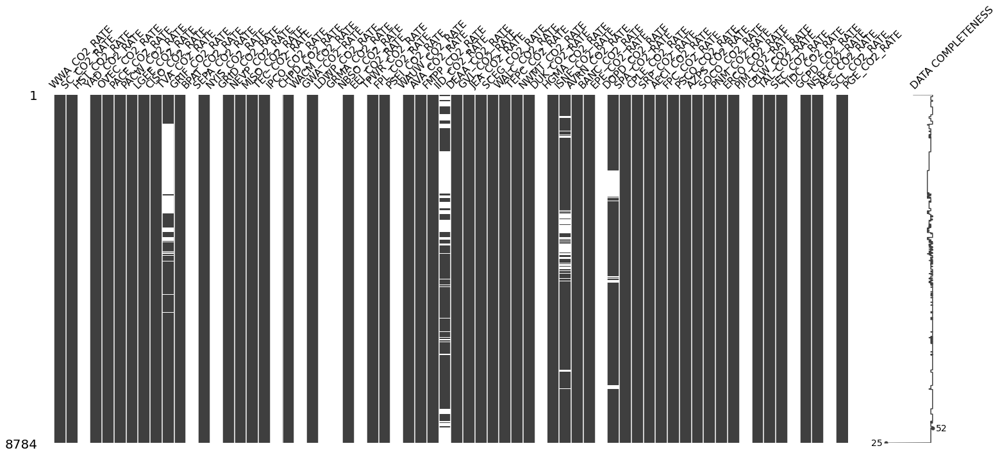

In [335]:
nanrates = hourly_consumed_calc.rates.replace(0,np.nan)
msno.matrix(nanrates, labels=True)

In [320]:
px.scatter(y=[F_new, F_orig], title="Produced emissions")

In [319]:
px.scatter(y=[P_new, P_orig], title="Net generation")

In [313]:
px.imshow(A_old-A_new)

# Why is emissions data so big ? 

In [210]:
consumed_calc.poll_data.df

,CO2_AEC_NG,CO2_AECI_NG,CO2_AESO_NG,CO2_AVA_NG,CO2_AVRN_NG,CO2_AZPS_NG,CO2_BANC_NG,CO2_BCHA_NG,CO2_BPAT_NG,CO2_CEN_NG,...,CO2_TEC_TI,CO2_TEPC_TI,CO2_TIDC_TI,CO2_TPWR_TI,CO2_TVA_TI,CO2_WACM_TI,CO2_WALC_TI,CO2_WAUW_TI,CO2_WWA_TI,CO2_YAD_TI
2018-07-01 00:00:00+00:00,722837.946646,2.558987e+06,439.000001,114772.657761,80514.740568,1.976384e+06,499054.478622,4.000000,335612.776671,439.000005,...,145496.799517,-195423.195261,-32103.830319,-5155.741268,-308262.593447,1.084487e+06,131588.621217,-33848.188237,768.834230,737.802770
2018-07-01 01:00:00+00:00,666238.223802,2.485406e+06,439.000001,117471.956723,86781.607203,2.097934e+06,493907.667789,4.000000,337522.192463,439.000007,...,76228.959440,-433556.444520,-36644.714831,-5085.824444,-351187.559304,1.039144e+06,100696.882219,-31867.283650,639.526286,736.400549
2018-07-01 02:00:00+00:00,611888.202489,2.323381e+06,439.000000,121503.630319,50087.060795,2.086198e+06,510814.609778,4.000000,340554.091374,439.000002,...,136407.793949,-639799.890576,-39488.823873,-4742.032433,-272446.874341,1.061485e+06,139840.243117,-27365.557338,881.772096,-494.425287
2018-07-01 03:00:00+00:00,533910.006339,2.111128e+06,439.000000,124344.171590,45634.827326,2.073630e+06,513511.615818,4.000000,344680.136369,439.000002,...,208915.040962,-706243.568145,-32004.958832,-4816.348165,-21187.715412,1.095513e+06,231178.509174,-28912.100148,938.833025,-516.543180
2018-07-01 04:00:00+00:00,475535.196116,2.111126e+06,439.000001,54484.881076,47041.598601,1.959990e+06,542214.458616,4.000000,347795.892060,439.000015,...,216172.862148,-199062.018616,-23278.303706,-5015.839512,-77536.804447,1.062628e+06,246455.090351,-29542.258671,551.944310,-453.347052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-19 16:00:00+00:00,231347.190750,2.417477e+06,439.000000,93039.851311,127724.791069,6.284752e+05,217226.974376,4.000000,669119.850858,439.000000,...,-2121.702906,-92633.515111,-5499.356746,-25200.816098,-683528.878877,8.652639e+05,363036.949770,-24268.781551,441.618706,332.267508
2022-04-19 17:00:00+00:00,229631.826980,2.407148e+06,439.000000,93695.356044,118041.223332,6.545472e+05,208725.190358,154.680861,647046.791643,439.000000,...,-8227.715267,-127937.205537,8620.051539,-24755.916280,-695219.246834,8.014298e+05,340981.405924,-22779.928431,593.059463,311.857525
2022-04-19 18:00:00+00:00,229968.847075,2.399863e+06,439.000000,93215.821864,132962.807404,8.991480e+05,213598.834914,377.666231,664859.563130,439.000000,...,-64610.676870,-180419.974431,9639.991041,-23640.843283,-751356.285835,8.234680e+05,285763.915345,-23462.290458,793.438462,328.210069
2022-04-19 19:00:00+00:00,230471.997496,2.202742e+06,439.000000,94395.134209,129696.814349,9.090551e+05,226871.431426,354.456895,665401.117702,439.000000,...,-64010.350830,-181241.848237,4754.046332,-24873.629063,-696737.700717,8.388669e+05,281108.727346,-23456.960204,742.414693,344.181685


In [211]:
hourly_consumed_calc.poll_data.df

,CO2_WWA_NG,CO2_SC_NG,CO2_HST_NG,CO2_YAD_NG,CO2_OVEC_NG,CO2_PACE_NG,CO2_PACW_NG,CO2_LGEE_NG,CO2_CISO_NG,CO2_TVA_NG,...,CO2_PJM_TI,CO2_CPLW_TI,CO2_TAL_TI,CO2_SEC_TI,CO2_TIDC_TI,CO2_GCPD_TI,CO2_NSB_TI,CO2_AEC_TI,CO2_SCL_TI,CO2_PGE_TI
2020-01-01 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 01:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 02:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 03:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 04:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00+00:00,0.0,6.901145e+09,0.0,0.0,6.847505e+09,1.754931e+10,3.065388e+08,1.437013e+10,1.497620e+10,1.888947e+10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-12-31 20:00:00+00:00,0.0,6.615332e+09,0.0,0.0,6.844194e+09,1.798666e+10,3.057994e+08,1.434805e+10,1.561986e+10,1.889622e+10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-12-31 21:00:00+00:00,0.0,6.437940e+09,0.0,0.0,6.863997e+09,1.879186e+10,3.054039e+08,1.431909e+10,1.562025e+10,1.939876e+10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-12-31 22:00:00+00:00,0.0,7.293112e+09,0.0,0.0,7.117415e+09,1.884701e+10,2.997613e+08,1.472941e+10,1.629705e+10,1.996355e+10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [391]:
[c for c in consumed_calc.df.columns if "HQT" in c]

['EBA.HQT-ALL.NG.H',
 'EBA.HQT-ALL.D.H',
 'EBA.HQT-ALL.TI.H',
 'EBA.HQT-ISNE.ID.H',
 'EBA.HQT-NYIS.ID.H',
 'EBA.ISNE-HQT.ID.H',
 'EBA.NYIS-HQT.ID.H',
 'EBA.HQT-ALL.NG.WAT.H',
 'CO2_HQT_NG',
 'CO2i_HQT_D',
 'CO2_HQT_D',
 'CO2_HQT-ISNE_ID',
 'CO2_HQT-NYIS_ID',
 'CO2_ISNE-HQT_ID',
 'CO2_NYIS-HQT_ID',
 'CO2_HQT_TI']

In [401]:
consumed_calc.df['EBA.HQT-ALL.NG.H']

2018-07-01 00:00:00+00:00    3697.957545
2018-07-01 01:00:00+00:00    3688.464923
2018-07-01 02:00:00+00:00    3263.995312
2018-07-01 03:00:00+00:00    3247.654688
2018-07-01 04:00:00+00:00    3268.613757
                                ...     
2022-04-19 16:00:00+00:00     697.123379
2022-04-19 17:00:00+00:00     669.561318
2022-04-19 18:00:00+00:00     624.614956
2022-04-19 19:00:00+00:00     598.598598
2022-04-19 20:00:00+00:00     617.796348
Name: EBA.HQT-ALL.NG.H, Length: 33160, dtype: float64

In [402]:
consumed_calc.df['EBA.HQT-ALL.NG.WAT.H']

2018-07-01 00:00:00+00:00    3697.957545
2018-07-01 01:00:00+00:00    3688.464923
2018-07-01 02:00:00+00:00    3263.995312
2018-07-01 03:00:00+00:00    3247.654688
2018-07-01 04:00:00+00:00    3268.613757
                                ...     
2022-04-19 16:00:00+00:00     697.123379
2022-04-19 17:00:00+00:00     669.561318
2022-04-19 18:00:00+00:00     624.614956
2022-04-19 19:00:00+00:00     598.598598
2022-04-19 20:00:00+00:00     617.796348
Name: EBA.HQT-ALL.NG.WAT.H, Length: 33160, dtype: float64

In [213]:
hourly_consumed_calc.rates

,WWA_CO2_RATE,SC_CO2_RATE,HST_CO2_RATE,YAD_CO2_RATE,OVEC_CO2_RATE,PACE_CO2_RATE,PACW_CO2_RATE,LGEE_CO2_RATE,CISO_CO2_RATE,TVA_CO2_RATE,...,PJM_CO2_RATE,CPLW_CO2_RATE,TAL_CO2_RATE,SEC_CO2_RATE,TIDC_CO2_RATE,GCPD_CO2_RATE,NSB_CO2_RATE,AEC_CO2_RATE,SCL_CO2_RATE,PGE_CO2_RATE
datetime_utc,,,,,,,,,,,,,,,,,,,,,
2020-01-01 07:00:00+00:00,0.0,3995970.6,-4849927.9,0.0,4617120.4,3620494.0,0.0,3794957.0,0.0,956348.9,...,1589192.7,0.0,3354243.9,3319240.8,NaN,NaN,-118072.3,2870310.5,0.0,0.0
2020-01-01 08:00:00+00:00,0.0,3998134.7,-4849927.9,0.0,4630619.6,3584152.2,796929.0,3815109.2,1847458.6,938473.7,...,1582427.5,0.0,3362870.3,3351583.8,2559685.7,0.0,-118072.3,2872445.8,0.0,2306459.4
2020-01-01 09:00:00+00:00,0.0,3967601.7,-4849927.9,0.0,4636085.7,3589726.9,967223.7,3804992.9,1844276.5,906402.6,...,1594894.8,0.0,3337103.6,3353936.7,2559665.6,0.0,-118072.3,2887518.8,0.0,2302114.7
2020-01-01 10:00:00+00:00,0.0,4095065.8,-4849927.9,0.0,4611960.3,3534449.2,1022350.7,3786936.4,1725855.3,900297.7,...,1593458.8,0.0,3316833.3,3345421.7,2582569.5,0.0,-118072.3,2884968.9,0.0,2274102.5
2020-01-01 11:00:00+00:00,0.0,3974198.2,-4849927.9,0.0,4591782.6,3635295.0,1069725.2,3794841.9,1722196.9,879932.7,...,1606792.5,0.0,3266342.8,3388108.9,2610132.4,0.0,-118072.3,2879671.4,0.0,2294642.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-01 02:00:00+00:00,0.0,3995003.7,-4765878.3,0.0,4499509.9,4090788.1,365595.1,3694852.4,1967837.6,1084769.7,...,1817171.1,0.0,3427475.5,3742449.6,2940930.1,0.0,-188461.5,2566317.4,0.0,1531988.3
2021-01-01 03:00:00+00:00,0.0,4115251.2,-4765878.3,0.0,4484704.1,4109347.6,317816.0,3687609.0,2063074.6,1021800.1,...,1784551.3,0.0,3468767.6,3750480.8,2965397.4,0.0,-188461.5,2554350.9,0.0,1501875.3
2021-01-01 04:00:00+00:00,0.0,4570856.2,-4765878.3,0.0,4481566.6,4233889.2,341465.1,3650160.8,2062849.3,938290.3,...,1750629.4,0.0,3498702.6,3819678.5,2936520.8,0.0,-188461.5,2555639.0,0.0,1491625.3


In [214]:
new = pd.read_csv("../data/results/carbon_accounting/CISO.csv")

In [221]:
new_rates = new["co2_mass_lb_total"] / new["net_generation_mwh_total"]

In [219]:
px.scatter(new_rates)

In [341]:
egrid = pd.read_excel(f"../data/downloads/egrid/egrid{2020}_data.xlsx", sheet_name=f"BA{str(2020)[-2:]}", header=1, index_col="BACODE", usecols=["BACO2RTA","BACODE"])

In [355]:
egrid = pd.read_excel(f"../data/downloads/egrid/egrid{2020}_data.xlsx", sheet_name=f"BA{str(2020)[-2:]}", header=1, index_col="BACODE", usecols=["BACO2RTA","BACODE"])
egrid = egrid.replace(0, np.nan)
avg = egrid["BACO2RTA"].mean()
egrid = egrid.replace(np.nan, avg)

In [356]:
egrid

,BACO2RTA
BACODE,
YAD,824.880393
AMPL,0.701000
AZPS,1578.054000
DEAA,875.996000
AECI,1431.950000
...,...
TEPC,1548.865000
TIDC,863.686000
WALC,380.564000


In [348]:
consumed_calc.poll_data.df[[c for c in consumed_calc.poll_data.df if c[-2:]=="NG"]].describe()

,CO2_AEC_NG,CO2_AECI_NG,CO2_AESO_NG,CO2_AVA_NG,CO2_AVRN_NG,CO2_AZPS_NG,CO2_BANC_NG,CO2_BCHA_NG,CO2_BPAT_NG,CO2_CEN_NG,CO2_CFE_NG,CO2_CHPD_NG,CO2_CISO_NG,CO2_CPLE_NG,CO2_CPLW_NG,CO2_DEAA_NG,CO2_DOPD_NG,CO2_DUK_NG,CO2_EEI_NG,CO2_EPE_NG,CO2_ERCO_NG,CO2_FMPP_NG,CO2_FPC_NG,CO2_FPL_NG,CO2_GCPD_NG,CO2_GRID_NG,CO2_GRIF_NG,CO2_GRMA_NG,CO2_GVL_NG,CO2_GWA_NG,CO2_HGMA_NG,CO2_HQT_NG,CO2_HST_NG,CO2_IESO_NG,CO2_IID_NG,CO2_IPCO_NG,CO2_ISNE_NG,CO2_JEA_NG,CO2_LDWP_NG,CO2_LGEE_NG,CO2_MHEB_NG,CO2_MISO_NG,CO2_NBSO_NG,CO2_NEVP_NG,CO2_NSB_NG,CO2_NWMT_NG,CO2_NYIS_NG,CO2_OVEC_NG,CO2_PACE_NG,CO2_PACW_NG,CO2_PGE_NG,CO2_PJM_NG,CO2_PNM_NG,CO2_PSCO_NG,CO2_PSEI_NG,CO2_SC_NG,CO2_SCEG_NG,CO2_SCL_NG,CO2_SEC_NG,CO2_SEPA_NG,CO2_SOCO_NG,CO2_SPA_NG,CO2_SPC_NG,CO2_SRP_NG,CO2_SWPP_NG,CO2_TAL_NG,CO2_TEC_NG,CO2_TEPC_NG,CO2_TIDC_NG,CO2_TPWR_NG,CO2_TVA_NG,CO2_WACM_NG,CO2_WALC_NG,CO2_WAUW_NG,CO2_WWA_NG,CO2_YAD_NG
count,33160.000000,3.316000e+04,33160.000000,33160.000000,33160.000000,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,33160.000000,33160.000000,33160.000000,3.316000e+04,3.316000e+04,33160.000000,33160.000000,33160.000000,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,33160.000000,33160.000000,33160.000000,33160.000000,33160.000000,33160.000000,33160.000000,3.316000e+04,33160.000000,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,33160.000000,3.316000e+04,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,33160.000000,3.316000e+04,33160.000000,33160.000000,3.316000e+04,3.316000e+04,33160.000000,3.316000e+04,3.316000e+04,33160.000000,33160.000000,3.316000e+04,3.316000e+04,3.316000e+04,33160.000000,33160.000000,33160.000000
mean,323256.628294,2.020340e+06,2530.921494,159995.634955,102236.855238,1.321228e+06,4.437769e+05,2249.747642,5.517816e+05,7765.209213,491.096920,3683.193235,4.143781e+06,2.065600e+06,189793.069061,126298.238760,1854.977587,3.664221e+06,4.494848e+05,252102.360557,1.825294e+07,1.225914e+06,2.739807e+06,5.256762e+06,4301.317197,6.138519e+05,160741.703065,203061.527597,136014.633609,784.604215,32740.979129,11129.910471,481.475787,7.548618e+05,252249.013328,156823.748495,3.197847e+06,7.817017e+05,1.404462e+06,3.611341e+06,3192.180397,3.808820e+07,153210.663784,1.695345e+06,841.362250,1.390947e+06,3.461499e+06,1.213620e+06,3.716275e+06,9.605478e+05,219310.696377,3.858616e+07,9.524518e+05,2.754506e+06,6.423369e+05,1.412788e+06,1.198217e+06,2565.787531,9.952763e+05,1028.691532,1.267272e+07,86109.584701,4877.089725,1.598037e+06,1.345766e+07,152156.216418,1.368129e+06,7.224547e+05,81251.865968,1071.165282,5.507077e+06,2.720789e+06,1.049269e+06,253.977516,910.764083,472.126916
std,140152.944365,5.404322e+05,10723.339570,45625.139264,76162.301604,6.242944e+05,1.782813e+05,2670.695536,2.063708e+05,21058.196550,345.630172,1222.677313,1.722703e+06,9.420012e+05,84195.923619,91338.862393,625.000389,1.563104e+06,1.785694e+05,98121.910461,6.243024e+06,3.860466e+05,7.774057e+05,1.664125e+06,1348.035859,1.924930e+05,80794.615963,50417.936650,38362.421661,780.750930,99203.062520,2496.548608,155.823027,2.139183e+05,51569.753736,81192.869377,1.156590e+06,2.560633e+05,5.764581e+05,7.843347e+05,2598.461188,1.003499e+07,106463.614410,4.523425e+05,93.725082,5.448990e+05,1.314091e+06,2.268383e+05,8.442219e+05,3.723001e+05,108672.596504,1.045126e+07,2.598409e+05,7.470153e+05,3.747335e+05,4.773412e+05,3.769123e+05,1049.522173,3.749850e+05,1221.544055,3.594328e+06,31333.445178,9523.830263,6.629905e+05,5.770399e+06,33969.667609,3.458620e+05,2.184073e+05,40904.079947,641.628081,1.986320e+06,5.012435e+05,2.664109e+05,72.515199,754.570013,269.688653
min,30190.583470,5.381609e+05,438.997377,21867.179725,531.000000,3.711424e+04,4.481982e+04,3.999982,1.083548e+05,438.993512,438.981618,229.037073,7.151223e+05,3.419745e+05,342

In [349]:
hourly_consumed_calc.poll_data.df[[c for c in hourly_consumed_calc.poll_data.df if c[-2:]=="NG"]].describe()

,CO2_WWA_NG,CO2_SC_NG,CO2_HST_NG,CO2_YAD_NG,CO2_OVEC_NG,CO2_PACE_NG,CO2_PACW_NG,CO2_LGEE_NG,CO2_CISO_NG,CO2_TVA_NG,CO2_GRIF_NG,CO2_BPAT_NG,CO2_SEPA_NG,CO2_NYIS_NG,CO2_GRID_NG,CO2_NEVP_NG,CO2_MISO_NG,CO2_TEC_NG,CO2_IPCO_NG,CO2_CHPD_NG,CO2_WACM_NG,CO2_GWA_NG,CO2_LDWP_NG,CO2_GRMA_NG,CO2_NBSO_NG,CO2_EEI_NG,CO2_TPWR_NG,CO2_FPL_NG,CO2_PSEI_NG,CO2_WAUW_NG,CO2_AVA_NG,CO2_FMPP_NG,CO2_IID_NG,CO2_DEAA_NG,CO2_GVL_NG,CO2_JEA_NG,CO2_SCEG_NG,CO2_WALC_NG,CO2_TEPC_NG,CO2_NWMT_NG,CO2_DUK_NG,CO2_HGMA_NG,CO2_ISNE_NG,CO2_AVRN_NG,CO2_BANC_NG,CO2_EPE_NG,CO2_DOPD_NG,CO2_SPA_NG,CO2_CPLE_NG,CO2_SRP_NG,CO2_AECI_NG,CO2_FPC_NG,CO2_PSCO_NG,CO2_AZPS_NG,CO2_SOCO_NG,CO2_PNM_NG,CO2_ERCO_NG,CO2_PJM_NG,CO2_CPLW_NG,CO2_TAL_NG,CO2_SEC_NG,CO2_TIDC_NG,CO2_GCPD_NG,CO2_NSB_NG,CO2_AEC_NG,CO2_SCL_NG,CO2_PGE_NG
count,8777.0,8.777000e+03,8777.000000,8777.0,8.777000e+03,8.777000e+03,8777.000000,8.777000e+03,8.777000e+03,8.777000e+03,8777.000000,8.777000e+03,8777.0,8.777000e+03,8776.0,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8776.0,8.777000e+03,8777.0,8.777000e+03,8777.0,8777.0,8.777000e+03,8777.0,8.777000e+03,8.777000e+03,8777.0,8777.000000,8.777000e+03,8777.000000,8766.000000,8777.000000,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8777.0,8.777000e+03,8776.000000,8.777000e+03,8.777000e+03,8776.0,8777.000000,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8.777000e+03,8777.0,8777.000000,8.777000e+03,8776.000000,8776.0,8777.0,8.777000e+03,8777.0,8.777000e+03
mean,0.0,3.394615e+06,7.921012,0.0,2.355019e+06,1.095377e+07,241378.963329,7.393638e+06,1.171581e+07,1.119747e+07,231132.761383,2.528986e+06,0.0,8.257669e+06,0.0,3.309616e+06,9.162149e+07,2.439992e+06,3.344211e+05,0.0,8.575351e+06,0.0,2.612218e+06,0.0,0.0,1.019283e+06,0.0,8.877091e+06,6.246690e+05,0.0,191273.515709,2.138972e+06,109752.987184,210443.654800,395893.541827,1.783102e+06,2.347243e+06,8.699357e+05,2.849518e+06,2.871272e+06,7.446059e+06,0.0,5.830239e+06,283266.783641,6.505480e+05,7.318464e+05,0.0,402997.812692,4.174484e+06,4.885605e+06,4.155030e+06,4.900942e+06,3.593580e+06,3.558422e+06,2.543513e+07,1.924946e+06,4.300916e+07,7.470665e+07,0.0,269128.441087,2.021277e+06,174492.354722,0.0,0.0,6.214779e+05,0.0,1.220720e+06
std,0.0,1.342510e+06,62.895434,0.0,9.760424e+05,2.453831e+06,127252.843666,1.410237e+06,4.906861e+06,4.532426e+06,174119.225928,1.586332e+06,0.0,3.249481e+06,0.0,1.057767e+06,2.254791e+07,6.186666e+05,2.714295e+05,0.0,1.497070e+06,0.0,1.058371e+06,0.0,0.0,5.148055e+05,0.0,2.825706e+06,3.790097e+05,0.0,102687.336940,5.967102e+05,87952.670867,183674.626061,105213.279856,4.830354e+05,7.768275e+05,3.373473e+05,6.580017e+05,1.291137e+06,2.906206e+06,0.0,2.268368e+06,161843.065548,1.916181e+05,2.225146e+05,0.0,154230.033210,2.329688e+06,1.678759e+06,1.115118e+06,1.814652e+06,1.114428e+06,1.293848e+06,7.833333e+06,5.546080e+05,1.293839e+07,2.122485e+07,0.0,57365.360716,5.622843e+05,81897.362952,0.0,0.0,3.510597e+05,0.0,7.477798e+05
min,0.0,1.477676e+06,0.000000,0.0,2.072097e+05,4.226403e+06,0.000000,4.538852e+06,0.000000e+00,3.254029e+06,0.000000,0.000000e+00,0.0,2.837616e+06,0.0,0.000000e+00,4.294237e+07,9.438308e+05,1.750557e+02,0.0,5.144910e+06,0.0,2.794916e+05,0.0,0.0,1.849260e+05,0.0,3.343916e+06,0.000000e+00,0.0,0.000000,6.915463e+05,0.000000,0.000000,164406.864815,6.505970e+05,8.356329e+05,9.896284e+04,1.280195e+06,2.569030e+05,2.759568e+06,0.0,1.631665e+06,0.000000,0.000000e+00,2.545539e+05,0.0,0.000000,7.653261e+05,1.198062e+06,1.274813e+06,2.161263e+06,1.191732e+06,4.435099e+05,1.128626e+07,1.516246e+05,1.717987e+07,3.824361e+07,0.0,130237.903510,4.482450e+05,23607.553950,0.0,0.0,8.686906e+04,0.0,0.000000e+00
25%,0.0,2.351430e+06,0.000000,0.0,1.750421e+06,9.169782e+06,165345.134175,6.369372e+06,8.185560e+06,7.934106e+06,0.000000,1.427631e+06,0.0,5.940971e+06,0.0,2.597308e+06,7.542942e+07,1.977217e+06,1.274911e+04,0.0,7.429905e+06,0.0,1.944713e+06,0.0,0.0,5.961961e+05,0.0,6.713966e+0